In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/p/poornendu.pabbati001/COVID/Covid_images_unn.npy')
masks = np.load('/hpcstor6/scratch01/p/poornendu.pabbati001/COVID/Covid_masks_unn.npy')

In [3]:
images.shape

(3616, 512, 512, 1)

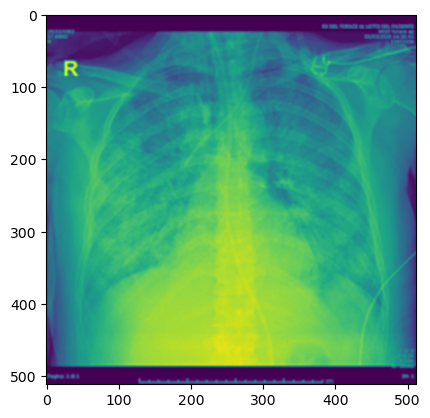

In [4]:
imshow(images[1001])

In [5]:
masks.shape

(3616, 512, 512, 1)

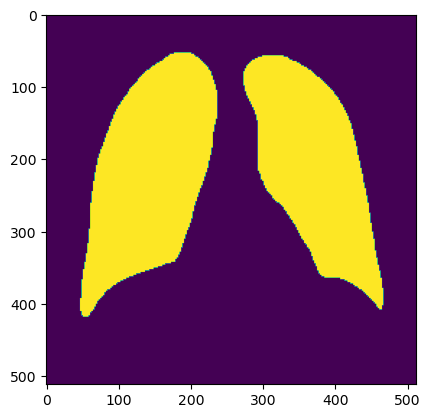

In [6]:
imshow(masks[1001])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpofrf4l4wkuc_unet2d


In [11]:
hist = C.train(images[0:2893], masks[0:2893], images[2893:3616], masks[2893:3616], batch_size=16, patience_counter=4)

Epoch 1/100
181/181 [==============================] - 67s 311ms/step - loss: 0.5105 - dice_coeff: 0.3033 - val_loss: 0.4991 - val_dice_coeff: 0.3220
Epoch 2/100
181/181 [==============================] - 49s 271ms/step - loss: 0.5322 - dice_coeff: 0.3523 - val_loss: 0.7829 - val_dice_coeff: 0.3195
Epoch 3/100
181/181 [==============================] - 49s 269ms/step - loss: 0.5042 - dice_coeff: 0.3139 - val_loss: 0.4865 - val_dice_coeff: 0.3470
Epoch 4/100
181/181 [==============================] - 49s 272ms/step - loss: 0.4463 - dice_coeff: 0.3944 - val_loss: 0.4026 - val_dice_coeff: 0.5014
Epoch 5/100
181/181 [==============================] - 49s 272ms/step - loss: 0.4713 - dice_coeff: 0.3906 - val_loss: 0.4573 - val_dice_coeff: 0.3974
Epoch 6/100
181/181 [==============================] - 49s 271ms/step - loss: 0.4406 - dice_coeff: 0.4078 - val_loss: 0.4485 - val_dice_coeff: 0.4529
Epoch 7/100
181/181 [==============================] - 49s 271ms/step - loss: 0.4341 - dice_coeff: 0

In [12]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

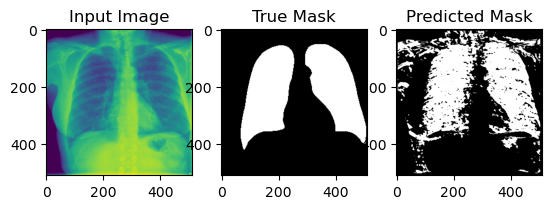

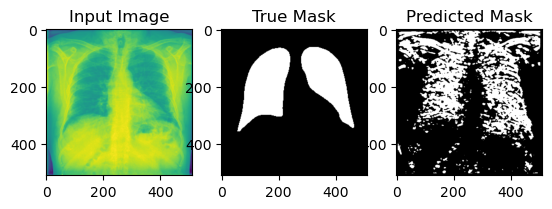

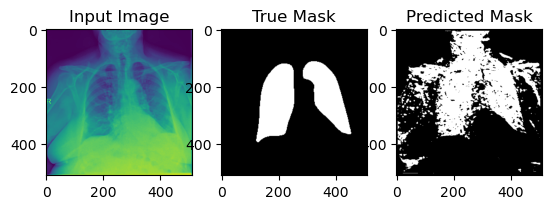

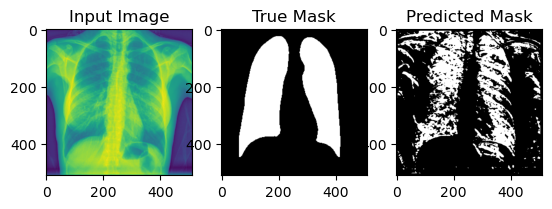

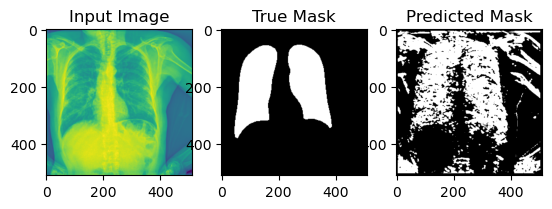

...

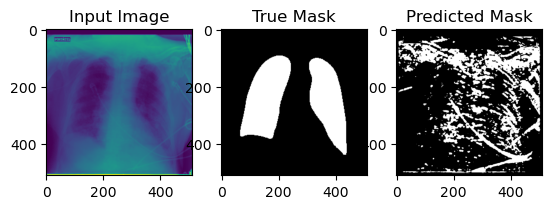

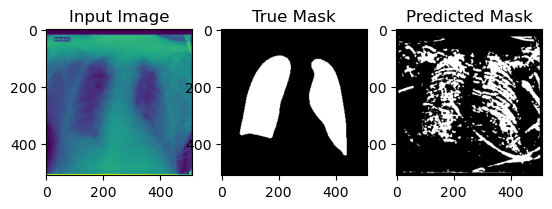

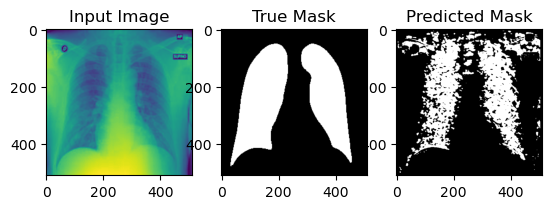

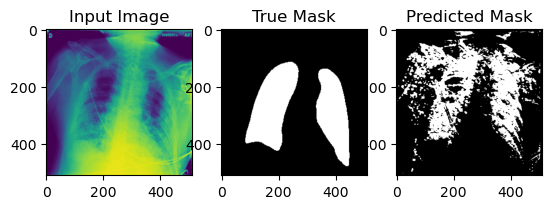

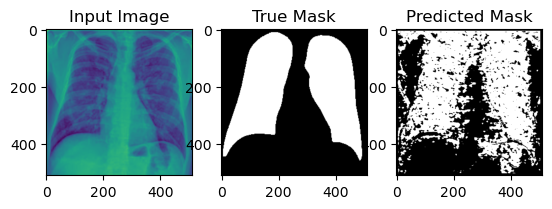

In [13]:
visualize_predictions(C, images[2893:3616], masks[2893:3616], num_samples=200)